# Hijearhijsko - sakupljajuce klasterovanje

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from joblib import load

In [2]:
X, Y = load('../../preprocessing/clustering_data.joblib')

In [3]:
X.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Satisfaction Score,Point Earned,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,Card Type_DIAMOND,Card Type_GOLD,Card Type_PLATINUM,Card Type_SILVER
0,-0.326221,0.293517,-1.041760,-1.225848,-0.911583,0.646092,0.970243,0.021886,-0.721130,-0.630839,0.997204,-0.578736,-0.573809,1.095988,-1.095988,1.728824,-0.577658,-0.57658,-0.576734
1,-0.440036,0.198164,-1.387538,0.117350,-0.911583,-1.547768,0.970243,0.216534,-0.009816,-0.666251,-1.002804,-0.578736,1.742740,1.095988,-1.095988,1.728824,-0.577658,-0.57658,-0.576734
2,-1.536794,0.293517,1.032908,1.333053,2.527057,0.646092,-1.030670,0.240687,-0.009816,-1.015942,0.997204,-0.578736,-0.573809,1.095988,-1.095988,1.728824,-0.577658,-0.57658,-0.576734
3,0.501521,0.007457,-1.387538,-1.225848,0.807737,-1.547768,-1.030670,-0.108918,1.412812,-1.135457,0.997204,-0.578736,-0.573809,1.095988,-1.095988,-0.578428,1.731128,-0.57658,-0.576734
4,2.063884,0.388871,-1.041760,0.785728,-0.911583,0.646092,0.970243,-0.365276,1.412812,-0.803472,-1.002804,-0.578736,1.742740,1.095988,-1.095988,-0.578428,1.731128,-0.57658,-0.576734


## t-SNE reduction

In [4]:
from sklearn.manifold import TSNE

n_components = 3
tsne = TSNE(n_components=n_components)
X_reduced = tsne.fit_transform(X)

Koristicemo **AgglomerativeClustering** iz sklearn-a za sakupljajuce klasterovanje.

In [10]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering

n_clusters_list = [2, 4, 5, 6, 7]
linkage_options = ['ward', 'complete', 'average', 'single']
sil_coefs = []

max_silhouette_score = -1
best_n_clusters = None
best_linkage = None

plt.figure(figsize=(60, 100)) 

for i, n_clusters in enumerate(n_clusters_list):
    for j, linkage in enumerate(linkage_options):
        # Inicijalizacija AgglomerativeClustering modela sa trenutnim brojem klastera i linkage opcijom
        model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        model.fit(X_reduced)
        
        silhouette_avg = silhouette_score(X_reduced, model.labels_)
        print(f'n_clusters={n_clusters}, linkage={linkage}, Silhouette score: {silhouette_avg:.2f}')
        
        sil_coefs.append(silhouette_avg)
        if silhouette_avg > max_silhouette_score:
            max_silhouette_score = silhouette_avg
            best_n_clusters = n_clusters
            best_linkage = linkage
        
        ax = plt.subplot(len(n_clusters_list), len(linkage_options), i * len(linkage_options) + j + 1, projection='3d')  
        ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=model.labels_, cmap='rainbow')
        ax.set_title(f'n_clusters={n_clusters}, linkage={linkage}', fontsize=40)
        ax.view_init(elev=30, azim=60)  

plt.tight_layout()
plt.show()


n_clusters=2, linkage=ward, Silhouette score: 0.23
n_clusters=2, linkage=complete, Silhouette score: 0.22
n_clusters=2, linkage=average, Silhouette score: 0.23
n_clusters=2, linkage=single, Silhouette score: 0.10
n_clusters=4, linkage=ward, Silhouette score: 0.25
n_clusters=4, linkage=complete, Silhouette score: 0.27
n_clusters=4, linkage=average, Silhouette score: 0.25
n_clusters=4, linkage=single, Silhouette score: 0.05
n_clusters=5, linkage=ward, Silhouette score: 0.28
n_clusters=5, linkage=complete, Silhouette score: 0.29
n_clusters=5, linkage=average, Silhouette score: 0.29
n_clusters=5, linkage=single, Silhouette score: 0.00
n_clusters=6, linkage=ward, Silhouette score: 0.32
n_clusters=6, linkage=complete, Silhouette score: 0.30
n_clusters=6, linkage=average, Silhouette score: 0.29
n_clusters=6, linkage=single, Silhouette score: -0.01
n_clusters=7, linkage=ward, Silhouette score: 0.34
n_clusters=7, linkage=complete, Silhouette score: 0.29
n_clusters=7, linkage=average, Silhouette

In [6]:
print(f'Best Silhouette score: {max_silhouette_score:.2f} za n_clusters={best_n_clusters}, linkage={best_linkage}')

Best Silhouette score: 0.34 za n_clusters=7, linkage=ward


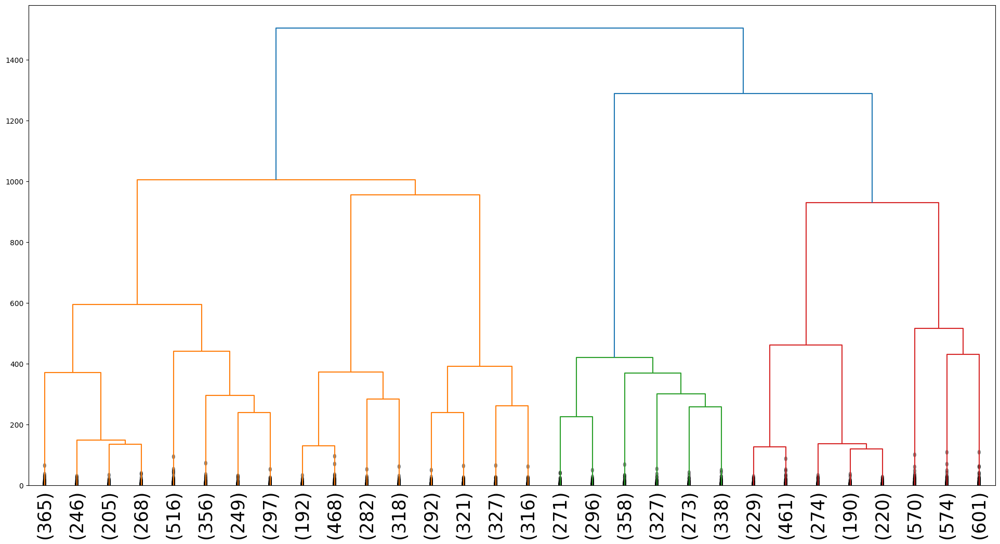

In [7]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage

plt.figure(figsize=(24,12))

dendrogram(
    linkage(X_reduced, method=best_linkage),
    labels=[i for i in range(len(X_reduced))],
    truncate_mode='lastp',
    show_contracted=True, 
    leaf_rotation=90,
    leaf_font_size=25,
)

plt.show()

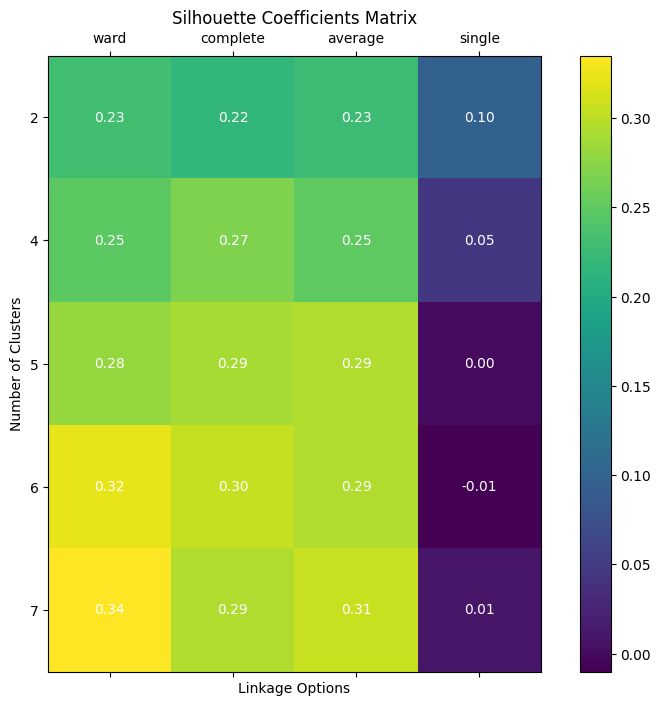

In [8]:
import numpy as np

arr = np.array(sil_coefs)
siluete_niz = arr.reshape(5, 4)

boje = plt.cm.viridis(siluete_niz)

fig, ax = plt.subplots(figsize=(10, 8))
cax = ax.matshow(siluete_niz, cmap=plt.cm.viridis)


ax.set_xticks(np.arange(len(linkage_options)))
ax.set_yticks(np.arange(len(n_clusters_list)))
ax.set_xticklabels(linkage_options)
ax.set_yticklabels(n_clusters_list)

for i in range(len(n_clusters_list)):
    for j in range(len(linkage_options)):
        ax.text(j, i, f'{siluete_niz[i, j]:.2f}', ha='center', va='center', color='w')

plt.colorbar(cax)
plt.xlabel('Linkage Options')
plt.ylabel('Number of Clusters')
plt.title('Silhouette Coefficients Matrix')
plt.show()